In [2]:
import cv2
import numpy as np
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt

from pathlib import Path


In [3]:
# CSRNet Architecture
class CSRNet(nn.Module):
    def __init__(self):
        super(CSRNet, self).__init__()
        vgg = torchvision.models.vgg16(pretrained=False)
        features = list(vgg.features.children())

        self.frontend = nn.Sequential(*features[:23])

        self.backend = nn.Sequential(
            nn.Conv2d(512, 512, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 256, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),
        )

        self.output_layer = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        x = self.output_layer(x)
        return x


In [4]:
import cv2
import numpy as np
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt
from pathlib import Path


In [5]:
import torch.nn as nn
import torchvision

class CSRNet(nn.Module):
    def __init__(self):
        super(CSRNet, self).__init__()

        # FRONTEND: VGG16 layers 0–22
        vgg = torchvision.models.vgg16(weights=None)
        self.frontend = nn.Sequential(*list(vgg.features[:23]))

        # BACKEND: CSRNet custom dilated convolution layers
        self.backend = nn.Sequential(
            nn.Conv2d(512, 512, 3, dilation=2, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 3, dilation=2, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, 3, dilation=2, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 256, 3, dilation=2, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, 3, dilation=2, padding=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, 3, dilation=2, padding=2),
            nn.ReLU(inplace=True)
        )

        # OUTPUT
        self.output_layer = nn.Conv2d(64, 1, 1)

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        x = self.output_layer(x)
        return x


In [6]:
class CSRNet(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

        self.frontend = nn.Sequential(*list(vgg.features.children())[:23])
        
        self.backend = nn.Sequential(
            nn.Conv2d(512,256,3,padding=1), nn.ReLU(True),
            nn.Conv2d(256,128,3,padding=1), nn.ReLU(True),
            nn.Conv2d(128,64,3,padding=1), nn.ReLU(True),
            nn.Conv2d(64,32,3,padding=1), nn.ReLU(True),
            nn.Conv2d(32,1,1)
        )

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        return x


In [7]:
import torch
import torch.nn as nn
import torchvision
from torchvision import models
import torchvision.transforms as T


In [8]:
class CSRNet(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

        self.frontend = nn.Sequential(*list(vgg.features.children())[:23])
        
        self.backend = nn.Sequential(
            nn.Conv2d(512,256,3,padding=1), nn.ReLU(True),
            nn.Conv2d(256,128,3,padding=1), nn.ReLU(True),
            nn.Conv2d(128,64,3,padding=1), nn.ReLU(True),
            nn.Conv2d(64,32,3,padding=1), nn.ReLU(True),
            nn.Conv2d(32,1,1)
        )

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        return x


In [9]:
import torch

# Select GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


In [10]:
modelA = CSRNet().to(device)
modelB = CSRNet().to(device)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 203MB/s] 


In [11]:
import os

folder = "/kaggle/input/combine-part-a-and-b/pytorch/default/1"
print(os.listdir(folder))


['partB_best (1).pth', 'csrnet_partA_finetuned_170.pth']


In [12]:
import os

print(os.listdir("/kaggle/input"))


['csrnet-dataset', 'combine-part-a-and-b', '2-part-a-models']


In [13]:
import os

print(os.listdir("/kaggle/input/2-part-a-models"))


['pytorch']


In [14]:
import os

print(os.listdir("/kaggle/input/2-part-a-models/pytorch"))


['models-a']


In [15]:
import os

print(os.listdir("/kaggle/input/2-part-a-models/pytorch/models-a"))


['1']


In [16]:
import os

print(os.listdir("/kaggle/input/2-part-a-models/pytorch/models-a/1"))


['csrnet_weights.pth', 'csrnet_finetuned_epoch200.pth']


In [17]:
import torch
import torch.nn as nn
import torchvision
from torchvision import models
import torchvision.transforms as T
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


In [18]:
class CSRNet(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

        self.frontend = nn.Sequential(*list(vgg.features.children())[:23])
        
        self.backend = nn.Sequential(
            nn.Conv2d(512,256,3,padding=1), nn.ReLU(True),
            nn.Conv2d(256,128,3,padding=1), nn.ReLU(True),
            nn.Conv2d(128,64,3,padding=1), nn.ReLU(True),
            nn.Conv2d(64,32,3,padding=1), nn.ReLU(True),
            nn.Conv2d(32,1,1)
        )

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        return x


In [19]:
import os

root = "/kaggle/input"
for path, dirs, files in os.walk(root):
    print(path)
    break


/kaggle/input


In [20]:
import os

print(os.listdir("/kaggle/input"))


['csrnet-dataset', 'combine-part-a-and-b', '2-part-a-models']


In [21]:
import os
print(os.listdir("/kaggle/input/combine-part-a-and-b"))


['pytorch']


In [22]:
import os
print(os.listdir("/kaggle/input/combine-part-a-and-b/pytorch"))


['default']


In [23]:
import os
print(os.listdir("/kaggle/input/combine-part-a-and-b/pytorch/default"))


['1']


In [24]:
import os
print(os.listdir("/kaggle/input/combine-part-a-and-b/pytorch/default/1"))


['partB_best (1).pth', 'csrnet_partA_finetuned_170.pth']


In [25]:
import os

partb_test = "/kaggle/input/csrnet-dataset/part_B_final/part_B_final/test_data/images"
print("Exists:", os.path.exists(partb_test))
print("Files:", os.listdir(partb_test)[:20])


Exists: True
Files: ['IMG_160.jpg', 'IMG_233.jpg', 'IMG_21.jpg', 'IMG_289.jpg', 'IMG_163.jpg', 'IMG_151.jpg', 'IMG_190.jpg', 'IMG_166.jpg', 'IMG_53.jpg', 'IMG_140.jpg', 'IMG_266.jpg', 'IMG_212.jpg', 'IMG_91.jpg', 'IMG_57.jpg', 'IMG_137.jpg', 'IMG_236.jpg', 'IMG_126.jpg', 'IMG_315.jpg', 'IMG_228.jpg', 'IMG_80.jpg']


In [26]:
example_image = "/kaggle/input/csrnet-dataset/part_B_final/part_B_final/test_data/images/IMG_10.jpg"


In [ ]:
img, img_t = load_and_preprocess(example_image)
print("Image loaded:", example_image)


In [ ]:
cntB, densB = predict_count_and_map(modelB, img_t)
show_heatmap(img, densB, title=f"PartB count {cntB:.1f}")


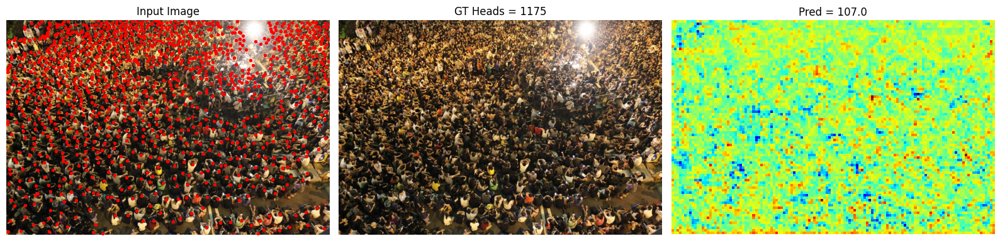

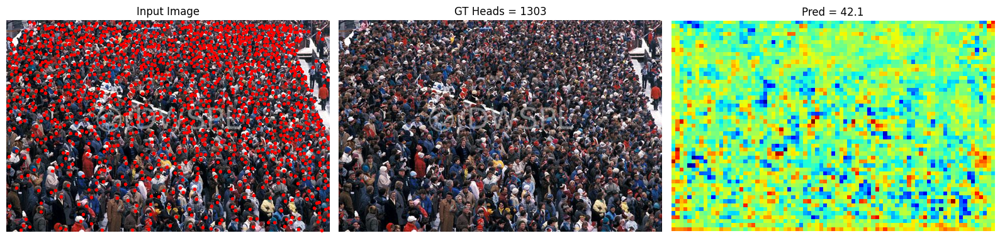

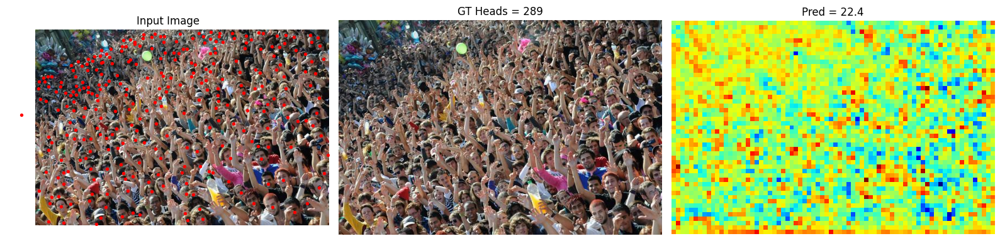

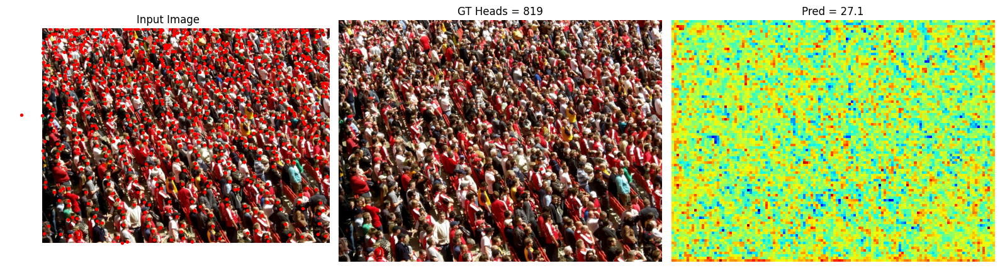

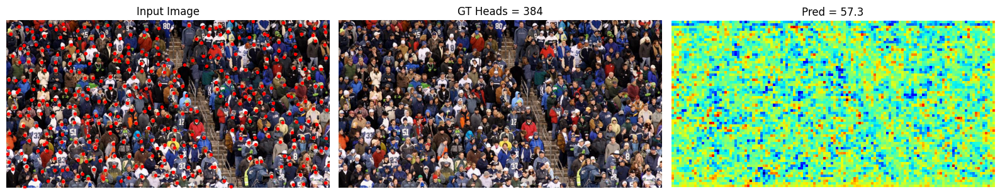

...

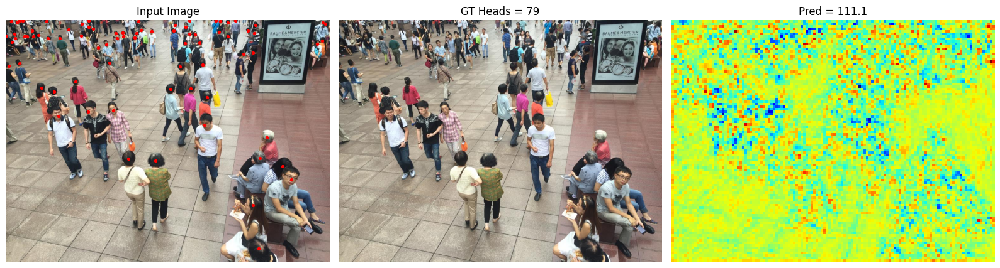

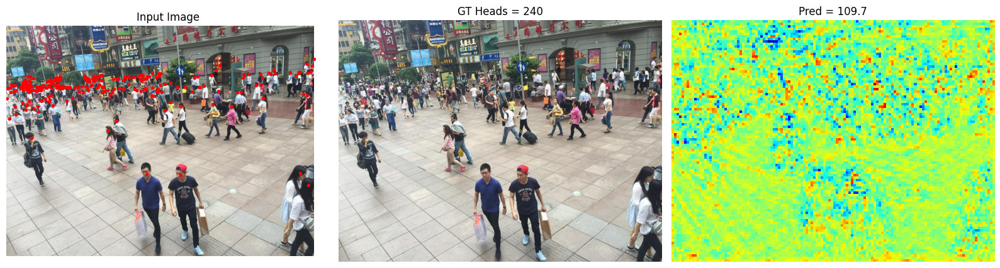

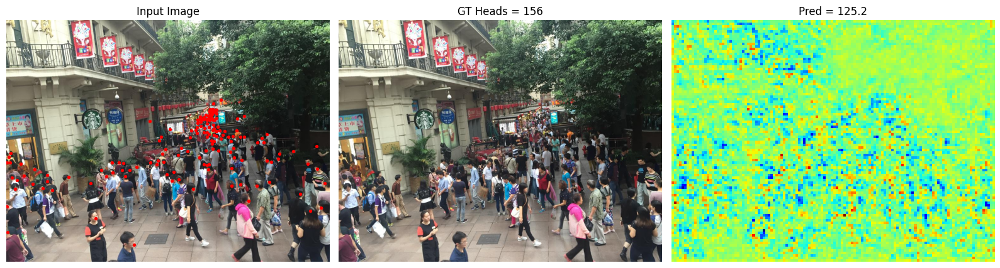

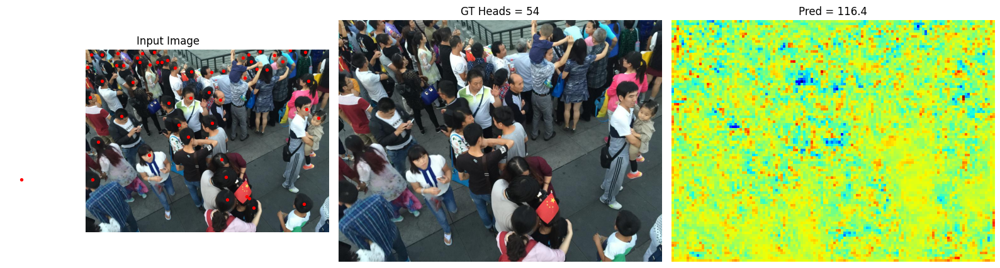

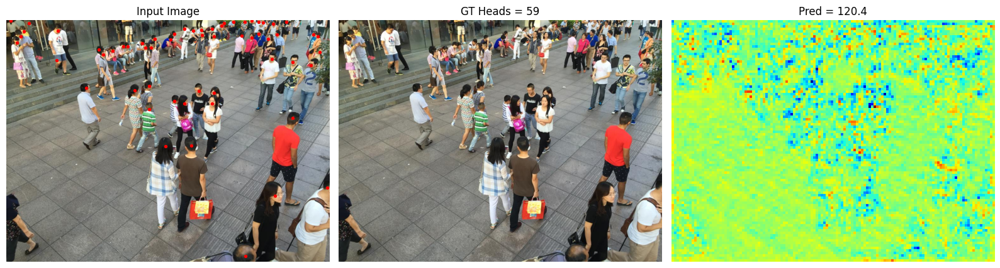

,Dataset,Image,GT Count,Pred Count,Absolute Error
0,Part-A,IMG_104.jpg,1175,107.024017,1067.975983
1,Part-A,IMG_150.jpg,1303,42.070320,1260.929680
2,Part-A,IMG_116.jpg,289,22.379951,266.620049
3,Part-A,IMG_5.jpg,819,27.057728,791.942272
4,Part-A,IMG_48.jpg,384,57.278412,326.721588
5,Part-A,IMG_109.jpg,381,46.063576,334.936424
6,Part-A,IMG_138.jpg,292,12.504665,279.495335
7,Part-A,IMG_24.jpg,553,80.708961,472.291039
8,Part-A,IMG_176.jpg,213,36.378975,176.621025
9,Part-A,IMG_182.jpg,199,93.282440,105.717560


In [29]:
import os
import random
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
from pathlib import Path

# -------------------------
# SETTINGS
# -------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

# PATHS
partA_img_dir = "/kaggle/input/csrnet-dataset/part_A_final/part_A_final/test_data/images"
partA_gt_dir  = "/kaggle/input/csrnet-dataset/part_A_final/part_A_final/test_data/ground_truth"

partB_img_dir = "/kaggle/input/csrnet-dataset/part_B_final/part_B_final/test_data/images"
partB_gt_dir  = "/kaggle/input/csrnet-dataset/part_B_final/part_B_final/test_data/ground_truth"

# Choose random 10 images
partA_images = random.sample(os.listdir(partA_img_dir), 10)
partB_images = random.sample(os.listdir(partB_img_dir), 10)

# -------------------------
# MODEL (use your Part-B model)
# -------------------------
model = modelB  # already loaded above
model.eval()

# -------------------------
# HELPERS
# -------------------------

# Preprocessing
transform = T.Compose([
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])

def load_annotations(mat_path):
    """Load CSRNet-style .mat annotation (head points)"""
    mat = sio.loadmat(mat_path)
    pts = mat["image_info"][0][0][0][0][0]
    return pts

def predict(img):
    """Return predicted count & density map"""
    img_t = transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        dens = model(img_t)
    dens_np = dens.squeeze().cpu().numpy()
    return dens_np.sum(), dens_np

def show_result(img, head_pts, dens_map, title):
    """Visualize: image + head annotation + density map"""
    plt.figure(figsize=(16,5))

    # INPUT + HEAD POINTS
    plt.subplot(1,3,1)
    plt.title("Input Image")
    plt.axis("off")
    plt.imshow(img)
    xs = head_pts[:,0]
    ys = head_pts[:,1]
    plt.scatter(xs, ys, s=8, c="red")

    # GT COUNT
    plt.subplot(1,3,2)
    plt.title(f"GT Heads = {len(head_pts)}")
    plt.axis("off")
    plt.imshow(img)

    # DENSITY MAP
    plt.subplot(1,3,3)
    plt.title(title)
    plt.axis("off")
    plt.imshow(dens_map, cmap="jet")

    plt.tight_layout()
    plt.show()


# -------------------------
# EVALUATION TABLE
# -------------------------
results = []

def evaluate_set(image_list, img_dir, gt_dir, tag):
    for fname in image_list:
        img_path = f"{img_dir}/{fname}"
        gt_path = f"{gt_dir}/GT_{fname.replace('.jpg','.mat')}"

        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Load GT annotation (head points)
        pts = load_annotations(gt_path)
        gt_count = len(pts)

        # Predict
        pred_count, dens_map = predict(img)
        abs_err = abs(gt_count - pred_count)

        # Save results
        results.append([tag, fname, gt_count, pred_count, abs_err])

        # Show visualization
        show_result(img, pts, dens_map, title=f"Pred = {pred_count:.1f}")

# Run evaluation
evaluate_set(partA_images, partA_img_dir, partA_gt_dir, "Part-A")
evaluate_set(partB_images, partB_img_dir, partB_gt_dir, "Part-B")

# -------------------------
# DISPLAY RESULT TABLE
# -------------------------
import pandas as pd
df = pd.DataFrame(results, columns=["Dataset","Image","GT Count","Pred Count","Absolute Error"])
df.style.background_gradient(cmap="Blues")
df


In [31]:
styled_df = df.style.background_gradient(cmap="GnBu").set_caption("Model Evaluation Summary")
styled_df


,Dataset,Image,GT Count,Pred Count,Absolute Error
0,Part-A,IMG_104.jpg,1175,107.024017,1067.975983
1,Part-A,IMG_150.jpg,1303,42.070320,1260.929680
2,Part-A,IMG_116.jpg,289,22.379951,266.620049
3,Part-A,IMG_5.jpg,819,27.057728,791.942272
4,Part-A,IMG_48.jpg,384,57.278412,326.721588
5,Part-A,IMG_109.jpg,381,46.063576,334.936424
6,Part-A,IMG_138.jpg,292,12.504665,279.495335
7,Part-A,IMG_24.jpg,553,80.708961,472.291039
8,Part-A,IMG_176.jpg,213,36.378975,176.621025
9,Part-A,IMG_182.jpg,199,93.282440,105.717560
